In [ ]:
## EXERCICE 3 : BAR CHART RACE

In [ ]:
# A partir du jeu de données PhD, nous allons nous intéresser à l’évolution de la langue d’écriture des thèses 
# au fil des ans (sur la période 1985-2018). Nous allons commencer par produire un graphe animé
# de type bar chart race. La barre que vous devez représenter correspond au pourcentage des thèses écrites en anglais. Vous devez faire en sorte 
# que la discipline avec le plus haut taux de thèses en anglais apparaisse en haut. Puis, lorsque le GIF se d´eclenche, le temps passe et la discipline 
# qui reste en haut evolue.

In [20]:
# Packages
import pandas as pd

# Vizualisation
import matplotlib.pyplot as plt
import bar_chart_race as bcr
from IPython.display import Image

In [3]:
# Load PhD dataset
phd_df= pd.read_csv('C:/Users/emmhu/OneDrive/Documents/E-LEARNING/DU DATA ANALYST/1_Manipulation et Prétraitement de données/Données/Theses Phd-Phdv2 (2e devoir)/PhD_v2.csv', 
                    sep= ",", low_memory= False)

phd_df.head()

,Auteur,Identifiant auteur,Titre,Directeur de these,Directeur de these (nom prenom),Identifiant directeur,Etablissement de soutenance,Identifiant etablissement,Discipline,Statut,Date de premiere inscription en doctorat,Date de soutenance,Year,Langue de la these,Identifiant de la these,Accessible en ligne,Publication dans theses.fr,Mise a jour dans theses.fr
0,Saeed Al marri,NaN,Le credit documentaire et l'onopposabilite des...,Philippe Delebecque,Delebecque Philippe,29561248,Paris 1,27361802,Driot prive,enCours,30-09-11,NaN,NaN,NaN,s69480,non,26-01-12,26-01-12
1,Andrea Ramazzotti,174423705,Application de la PGD a la resolution de probl...,"Jean-Claude Grandidier,Marianne Beringhier","Grandidier Jean-Claude,Beringhier Marianne","715,441,511","Chasseneuil-du-Poitou, Ecole nationale superie...",28024400,"Mecanique des solides, des materiaux, des stru...",enCours,01-10-12,NaN,NaN,NaN,s98826,non,22-11-13,22-11-13
2,OLIVIER BODENREIDER,NaN,Conception d'un outil informatique d'etude des...,Francois Kohler,Kohler Francois,57030758,Nancy 1,NaN,Medecine,soutenue,NaN,01-01-93,1993.0,fr,1993NAN19006,non,24-05-13,17-11-12
3,Emmanuel Porte,NaN,Socio-histoire des politiques publiques en mat...,Gilles Pollet,Pollet Gilles,na,Lyon 2,02640334X,Science politique,enCours,01-06-11,NaN,NaN,NaN,s88867,non,12-07-13,12-01-16
4,Arthur Devriendt,NaN,LES TECHNOLOGIES DE L'INFORMATION ET DE LA COM...,Gabriel Dupuy,Dupuy Gabriel,na,Paris 1,27361802,Geographie,enCours,07-12-09,NaN,NaN,NaN,s89663,non,13-07-13,12-07-13


In [4]:
# Inspecting Data
print(phd_df.shape)
print(phd_df.info())
print(phd_df.describe(include= 'all'))

(447644, 18)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 447644 entries, 0 to 447643
Data columns (total 18 columns):
 #   Column                                    Non-Null Count   Dtype  
---  ------                                    --------------   -----  
 0   Auteur                                    447644 non-null  object 
 1   Identifiant auteur                        317655 non-null  object 
 2   Titre                                     447635 non-null  object 
 3   Directeur de these                        447629 non-null  object 
 4   Directeur de these (nom prenom)           447629 non-null  object 
 5   Identifiant directeur                     447644 non-null  object 
 6   Etablissement de soutenance               447640 non-null  object 
 7   Identifiant etablissement                 430559 non-null  object 
 8   Discipline                                447639 non-null  object 
 9   Statut                                    447644 non-null  object 
 10  Date de

In [5]:
# Create a language subset
language_df= phd_df[['Date de soutenance', 'Discipline', 'Langue de la these']]

language_df.head()

,Date de soutenance,Discipline,Langue de la these
0,NaN,Driot prive,NaN
1,NaN,"Mecanique des solides, des materiaux, des stru...",NaN
2,01-01-93,Medecine,fr
3,NaN,Science politique,NaN
4,NaN,Geographie,NaN


In [6]:
# Checking for missing values quantity
missing= language_df.isnull().sum()
print('Quantity of missing values are :\n',)
print(missing)

# Checking for missing values percentage
missing_pct= (language_df.isnull().sum() * 100 / len(language_df)).round(2)
print('Percentage of missing values are :\n')
print(missing_pct)

Quantity of missing values are :

Date de soutenance    56746
Discipline                5
Langue de la these    63765
dtype: int64
Percentage of missing values are :

Date de soutenance    12.68
Discipline             0.00
Langue de la these    14.24
dtype: float64


In [7]:
# Dropping missing values
languages=language_df[['Date de soutenance', 'Discipline', 'Langue de la these']].dropna()

In [8]:
# Add the year column and convert 'Date de soutenance' column to Datetime before extracting year
languages['Year']= pd.to_datetime(phd_df['Date de soutenance'], errors= 'coerce').dt.year

# Converting Year column to integer to remove comma
languages['Year']= languages['Year'].astype(int)

C:\Users\emmhu\AppData\Local\Temp\ipykernel_25488\3447008957.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  languages['Year']= pd.to_datetime(phd_df['Date de soutenance'], errors= 'coerce').dt.year


In [9]:
# Filter the dataframe on thesis from 1985 to 2018
languages_85_18 = languages[(languages['Year'] >= 1985) & (languages['Year'] <= 2018)]
languages_85_18.head()

,Date de soutenance,Discipline,Langue de la these,Year
2,01-01-93,Medecine,fr,1993
79,01-01-15,Histoire et archeologie medievales,fr,2015
134,01-01-15,Sciences du langage,fr,2015
318,07-12-13,Lettres modernes,fr,2013
376,25-11-13,Staps,fr,2013


In [10]:
# Focus on relevant columns for this analysis
phd_df_filtered = languages_85_18[['Discipline', 'Year', 'Langue de la these']]

# Check for missing or invalid data in the filtered dataset
phd_df_filtered.info()

# Display a preview of the cleaned and filtered data
phd_df_filtered.head()

<class 'pandas.core.frame.DataFrame'>
Index: 373503 entries, 2 to 447628
Data columns (total 3 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   Discipline          373503 non-null  object
 1   Year                373503 non-null  int32 
 2   Langue de la these  373503 non-null  object
dtypes: int32(1), object(2)
memory usage: 10.0+ MB


,Discipline,Year,Langue de la these
2,Medecine,1993,fr
79,Histoire et archeologie medievales,2015,fr
134,Sciences du langage,2015,fr
318,Lettres modernes,2013,fr
376,Staps,2013,fr


In [11]:
# Replace missing values in 'Langue de la these' with 'unknown'
phd_df_filtered['Langue de la these'] = phd_df_filtered['Langue de la these'].fillna('unknown')

# Identify English theses (assuming 'en' represents English)
phd_df_filtered['Is_English'] = phd_df_filtered['Langue de la these'].str.lower() == 'en'

C:\Users\emmhu\AppData\Local\Temp\ipykernel_25488\2296306716.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  phd_df_filtered['Langue de la these'] = phd_df_filtered['Langue de la these'].fillna('unknown')


In [12]:
# Step 1: Keep only theses written in English
english_theses = phd_df_filtered[phd_df_filtered['Is_English'] == True]

# Step 2: Count the number of theses by year and discipline
theses_count = english_theses.groupby(['Year', 'Discipline']).size().reset_index(name='Count')

In [14]:
# Step 3: Identify the top 10 most represented disciplines
top_disciplines = theses_count.groupby('Discipline')['Count'].sum().nlargest(10).index

# Step 4: Filter for the top 10 disciplines
top_theses_count = theses_count[theses_count['Discipline'].isin(top_disciplines)]

# Display the resulting dataset
top_theses_count

,Year,Discipline,Count
10,1986,Mathematiques,3
22,1987,Physique,2
34,1988,Informatique,2
35,1988,Mecanique,1
43,1989,Mathematiques appliquees,1
...,...,...,...
8675,2018,Mecanique,35
8743,2018,Neurosciences,64
8802,2018,Physique,152
8917,2018,Sciences de gestion,54


In [15]:
# Step 5: Calculate the percentage column
total_theses_per_year = top_theses_count.groupby('Year')['Count'].sum()
top_theses_count = top_theses_count.merge(total_theses_per_year, on='Year', suffixes=('', '_Total'))
top_theses_count['Percentage'] = (top_theses_count['Count'] / top_theses_count['Count_Total']) * 100

top_theses_count

,Year,Discipline,Count,Count_Total,Percentage
0,1986,Mathematiques,3,3,100.000000
1,1987,Physique,2,2,100.000000
2,1988,Informatique,2,3,66.666667
3,1988,Mecanique,1,3,33.333333
4,1989,Mathematiques appliquees,1,1,100.000000
...,...,...,...,...,...
214,2018,Mecanique,35,1081,3.237743
215,2018,Neurosciences,64,1081,5.920444
216,2018,Physique,152,1081,14.061055
217,2018,Sciences de gestion,54,1081,4.995375


In [16]:
# Convert the top_theses_count table from long to wide format
theses_pivot_df= top_theses_count.pivot(index= 'Year', columns= 'Discipline', values= 'Percentage')

# Check missing values resulting from the pivot table
missing_data_pct = (theses_pivot_df.isnull().sum() * 100 / len(theses_pivot_df)).round(2)
print('Percentage of missing data are (%) : \n', missing_data_pct)

Percentage of missing data are (%) : 
 Discipline
Aspects moleculaires et cellulaires de la biologie    48.48
Chimie                                                39.39
Informatique                                          21.21
Mathematiques                                         15.15
Mathematiques appliquees                              24.24
Mecanique                                             45.45
Neurosciences                                         42.42
Physique                                              21.21
Sciences de gestion                                   51.52
Sciences economiques                                  27.27
dtype: float64


In [17]:
# interpolation to estimate missing values based on nearby years
theses_pivot_df2 = theses_pivot_df.interpolate(method='linear', axis=0)

theses_pivot_df2

Discipline,Aspects moleculaires et cellulaires de la biologie,Chimie,Informatique,Mathematiques,Mathematiques appliquees,Mecanique,Neurosciences,Physique,Sciences de gestion,Sciences economiques
Year,,,,,,,,,,
1986,NaN,NaN,NaN,100.000000,NaN,NaN,NaN,NaN,NaN,NaN
1987,NaN,NaN,NaN,91.666667,NaN,NaN,NaN,100.000000,NaN,NaN
1988,NaN,NaN,66.666667,83.333333,NaN,33.333333,NaN,85.416667,NaN,NaN
1989,NaN,NaN,58.333333,75.000000,100.000000,30.952381,NaN,70.833333,NaN,NaN
1990,NaN,NaN,50.000000,66.666667,50.000000,28.571429,NaN,56.250000,NaN,NaN
1991,NaN,NaN,50.000000,58.333333,100.000000,26.190476,NaN,41.666667,NaN,NaN
1992,NaN,NaN,50.000000,50.000000,56.250000,23.809524,NaN,27.083333,NaN,NaN
1993,NaN,12.500000,12.500000,37.500000,12.500000,21.428571,NaN,12.500000,NaN,12.500000
1994,NaN,20.000000,17.361111,40.000000,17.361111,19.047619,NaN,40.000000,NaN,13.095238


In [18]:
# Forward/Backward fill to finish handling NaN values
theses_pivot_df_clean = theses_pivot_df2.fillna(method='ffill').fillna(method='bfill')
theses_pivot_df_clean

C:\Users\emmhu\AppData\Local\Temp\ipykernel_25488\1319378796.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  theses_pivot_df_clean = theses_pivot_df2.fillna(method='ffill').fillna(method='bfill')


Discipline,Aspects moleculaires et cellulaires de la biologie,Chimie,Informatique,Mathematiques,Mathematiques appliquees,Mecanique,Neurosciences,Physique,Sciences de gestion,Sciences economiques
Year,,,,,,,,,,
1986,5.000000,12.500000,66.666667,100.000000,100.000000,33.333333,10.526316,100.000000,1.315789,12.500000
1987,5.000000,12.500000,66.666667,91.666667,100.000000,33.333333,10.526316,100.000000,1.315789,12.500000
1988,5.000000,12.500000,66.666667,83.333333,100.000000,33.333333,10.526316,85.416667,1.315789,12.500000
1989,5.000000,12.500000,58.333333,75.000000,100.000000,30.952381,10.526316,70.833333,1.315789,12.500000
1990,5.000000,12.500000,50.000000,66.666667,50.000000,28.571429,10.526316,56.250000,1.315789,12.500000
1991,5.000000,12.500000,50.000000,58.333333,100.000000,26.190476,10.526316,41.666667,1.315789,12.500000
1992,5.000000,12.500000,50.000000,50.000000,56.250000,23.809524,10.526316,27.083333,1.315789,12.500000
1993,5.000000,12.500000,12.500000,37.500000,12.500000,21.428571,10.526316,12.500000,1.315789,12.500000
1994,5.000000,20.000000,17.361111,40.000000,17.361111,19.047619,10.526316,40.000000,1.315789,13.095238


In [ ]:
# Generate a bar chart race animation
bcr.bar_chart_race(
    df=theses_pivot_df_clean,
    filename='bar_chart_race.gif',
    orientation='h',
    sort='desc',
    n_bars=10,
    fixed_order=False,
    fixed_max=True,
    steps_per_period=25,
    interpolate_period=True,
    label_bars=True,
    title='English thesis by discipline (1985-2018)',
    period_label={'x': 0.95, 'y': 0.2, 'ha': 'right'},
    period_length=500
)

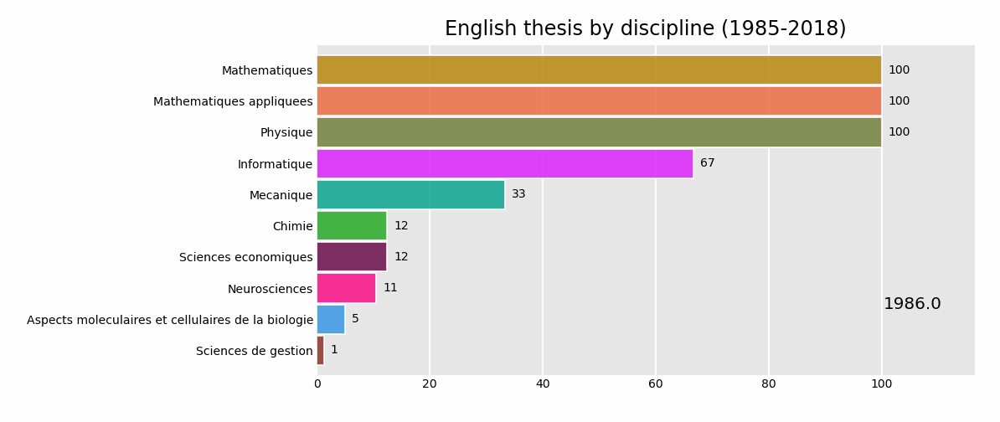

In [21]:
# Display the generated GIF
Image(filename='C:/Users/emmhu/OneDrive/Documents/E-LEARNING\DU DATA ANALYST\Parcours opérationnel/4. Data Storytelling/Exercice 3_bar-chart-race/bar_chart_race.gif')